In [ ]:
using LinearAlgebra
using Statistics
using Plots
using Printf
using SparseArrays
using Base.Threads

# Visualize solution (SSPRK3)

Steps: 551


[ Info: Saved animation to /content/burgers.gif


Plots.AnimatedGif("/content/burgers.gif")
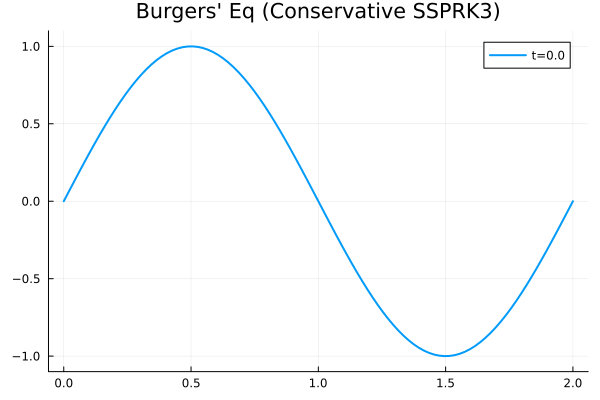

In [ ]:
"""
Spatial discretization: Conservative Form
"""
function burgers_rhs!(du, u, p, dx, ::Val{Method}) where Method
    nu = p
    N = length(u)

    @inbounds for i in 1:N
        # Fast periodic indexing
        ip1 = (i == N) ? 1 : i + 1
        im1 = (i == 1) ? N : i - 1

        flux_diff = 0.0


        if Method == :central
            # Conservative Advection
            # discretized as (u[i+1]^2 - u[i-1]^2) / (4dx)
            flux_diff = (u[ip1]^2 - u[im1]^2) / (4 * dx)
        elseif Method == :upwind
            if u[i] >= 0
                # Flow is to the right: use backward difference
                flux_diff = (u[i]^2 - u[im1]^2) / (2 * dx)
            else
                # Flow is to the left: use forward difference
                flux_diff = (u[ip1]^2 - u[i]^2) / (2 * dx)
            end
        end

        # Diffusiony
        # discretized as nu * (u[i+1] - 2u[i] + u[i-1]) / dx^2
        diff_term = nu * (u[ip1] - 2u[i] + u[im1]) / (dx^2)
        du[i] = diff_term - flux_diff
    end
end
burgers_rhs_wrapper!(du, u, p, dx, method::Symbol) = burgers_rhs!(du, u, p, dx, Val(method))



"""
Example with SSPRK3
"""
function solve_burgers_ssprk3(u0, T, CFL, nx, nu, L, method)
    dx = L / nx

    u_max = maximum(abs.(u0))

    # Stability constraints
    dt_adv = dx / u_max
    dt_diff = 0.5 * dx^2 / nu
    dt = CFL * min(dt_adv, dt_diff)

    nt = ceil(Int, T/dt)
    dt = T / nt

    # Pre-allocate arrays
    u = copy(u0)
    u1 = similar(u)
    u2 = similar(u)
    k = similar(u) # RHS

    # Store history
    history = zeros(nt+1, nx)
    history[1, :] = u
    t_vals = LinRange(0, T, nt+1)

    for n in 1:nt
        # Stage 1
        burgers_rhs_wrapper!(k, u, nu, dx, method)
        @. u1 = u + dt * k

        # Stage 2
        burgers_rhs_wrapper!(k, u1, nu, dx, method)
        @. u2 = (3/4)*u + (1/4)*u1 + (1/4)*dt*k

        # Stage 3
        burgers_rhs_wrapper!(k, u2, nu, dx, method)
        @. u = (1/3)*u + (2/3)*u2 + (2/3)*dt*k

        # Save
        history[n+1, :] = u
    end

    return LinRange(0, L, nx), t_vals, history
end

function main()
    # Params
    nu = 0.0 / pi
    L = 2.0
    nx = 100
    T = 5.50
    CFL = 0.5

    x_grid = LinRange(0, L, nx)
    u0 = sin.(pi * x_grid)

    x, t, u_history = solve_burgers_ssprk3(u0, T, CFL, nx, nu, L, :upwind)

    println("Steps: $(length(t))")

    anim = @animate for i in 1:5:length(t) # Plot every 5th frame for speed
        plot(x, u_history[i, :],
            title="Burgers' Eq (Conservative SSPRK3)",
            ylim=(-1.1, 1.1), label="t=$(round(t[i], digits=2))", lw=2)
    end
    gif(anim, "burgers.gif", fps=15)
end

main()

# Visualize solution (all methods)

In [ ]:
"""
Solver
methods: :euler, :heun, :ssprk3, :rk3_classic, :rk4
"""
function solve_burgers(u0, T, CFL, nx, nu, L, space_method, time_stepper)
    dx = L / nx

    u_max = maximum(abs.(u0))
    u_max = u_max == 0 ? 1.0 : u_max

    dt_adv = dx / u_max
    dt_diff = (nu > 1e-16) ? (0.5 * dx^2 / nu) : Inf
    dt = CFL * min(dt_adv, dt_diff)

    nt = ceil(Int, T/dt)
    dt = T / nt

    println("Using Time Stepper: $time_stepper | dt: $(round(dt, digits=5)) | Steps: $nt")

    # Pre-allocate arrays
    u = copy(u0)

    # temporary arrays
    u_tmp = similar(u)
    k1 = similar(u)
    k2 = similar(u)
    k3 = similar(u)
    k4 = similar(u)

    # History
    history = zeros(nt+1, nx)
    history[1, :] = u
    t_vals = LinRange(0, T, nt+1)

    for n in 1:nt
        if time_stepper == :euler
            # Forward Euler
            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)
            @. u = u + dt * k1

        elseif time_stepper == :heun
            # Heun's Method (RK2)
            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)
            @. u_tmp = u + dt * k1  # Predictor
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, space_method)
            @. u = u + (dt / 2) * (k1 + k2)

        elseif time_stepper == :ssprk3
            # SSP-RK3 (Shu-Osher)
            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)
            @. u_tmp = u + dt * k1

            burgers_rhs_wrapper!(k1, u_tmp, nu, dx, space_method)
            @. u_tmp = (3/4)*u + (1/4)*u_tmp + (1/4)*dt*k1

            burgers_rhs_wrapper!(k1, u_tmp, nu, dx, space_method)
            @. u = (1/3)*u + (2/3)*u_tmp + (2/3)*dt*k1

        elseif time_stepper == :rk3_classic
            # Classic RK3 (Heun's 3rd order)

            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)

            @. u_tmp = u + (dt / 3) * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, space_method)

            @. u_tmp = u + (2 * dt / 3) * k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, space_method)

            @. u = u + (dt / 4) * (k1 + 3 * k3)

        elseif time_stepper == :rk4
            # Classic RK4

            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)

            @. u_tmp = u + 0.5 * dt * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, space_method)

            @. u_tmp = u + 0.5 * dt * k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, space_method)

            @. u_tmp = u + dt * k3
            burgers_rhs_wrapper!(k4, u_tmp, nu, dx, space_method)

            @. u = u + (dt / 6) * (k1 + 2*k2 + 2*k3 + k4)
        else
            error("Time stepper :$time_stepper not in list.")
        end

        # Save history
        history[n+1, :] = u
    end

    return LinRange(0, L, nx), t_vals, history
end

solve_burgers

Using Time Stepper: rk4 | dt: 0.01 | Steps: 100
Simulation complete.


[ Info: Saved animation to /content/burgers_rk4.gif


Plots.AnimatedGif("/content/burgers_rk4.gif")
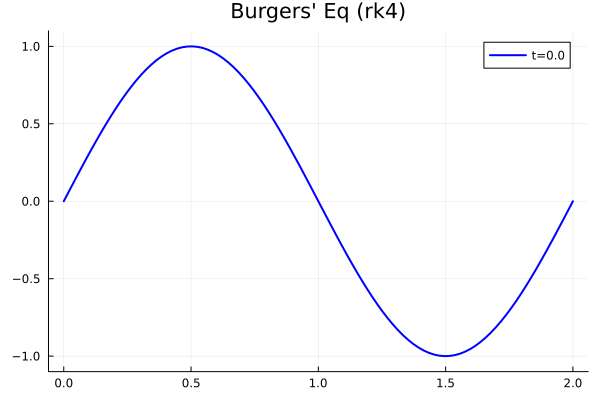

In [ ]:
function main()

    nu = 0.0
    L = 2.0
    nx = 100
    T = 1.0
    CFL = 0.5

    x_grid = LinRange(0, L, nx)
    u0 = sin.(pi * x_grid)

    # methods: : :euler, :heun, :ssprk3, :rk3_classic, :rk4
    method_choice = :rk4

    # spatial methods: :central, :upwind
    x, t, u_history = solve_burgers(u0, T, CFL, nx, nu, L, :central, method_choice)

    println("Simulation complete.")

    anim = @animate for i in 1:2:length(t) # Plot every 2nd frame
        plot(x, u_history[i, :],
            title="Burgers' Eq ($method_choice)",
            ylim=(-1.1, 1.1),
            label="t=$(round(t[i], digits=2))",
            lw=2, linecolor=:blue)
    end
    gif(anim, "burgers_$(method_choice).gif", fps=15)
end

main()

Using Time Stepper: rk4 | dt: 0.01 | Steps: 100
Simulation complete.


[ Info: Saved animation to /content/burgers_rk4.gif


Plots.AnimatedGif("/content/burgers_rk4.gif")
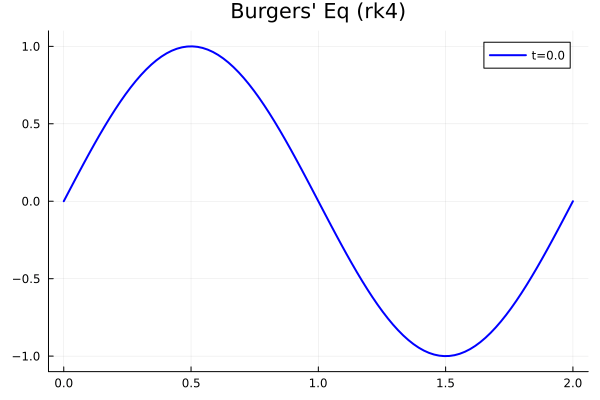

In [ ]:
function main()

    nu = 0.0
    L = 2.0
    nx = 100
    T = 1.0
    CFL = 0.5

    x_grid = LinRange(0, L, nx)
    u0 = sin.(pi * x_grid)

    # methods: : :euler, :heun, :ssprk3, :rk3_classic, :rk4
    method_choice = :rk4

    # spatial methods: :central, :upwind
    x, t, u_history = solve_burgers(u0, T, CFL, nx, nu, L, :upwind, method_choice)

    println("Simulation complete.")

    anim = @animate for i in 1:2:length(t) # Plot every 2nd frame
        plot(x, u_history[i, :],
            title="Burgers' Eq ($method_choice)",
            ylim=(-1.1, 1.1),
            label="t=$(round(t[i], digits=2))",
            lw=2, linecolor=:blue)
    end
    gif(anim, "burgers_$(method_choice).gif", fps=15)
end

main()

# Convergence order test

In [ ]:
function solve_burgers_time_stepping(u0, T, dt, nx, nu, L, spatial_method, time_scheme)
    dx = L / nx
    nt = ceil(Int, T/dt)
    dt_actual = T / nt
    u = copy(u0)
    u_tmp = similar(u)
    k1 = similar(u); k2 = similar(u); k3 = similar(u); k4 = similar(u)

    for n in 1:nt
        if time_scheme == :euler
            burgers_rhs_wrapper!(k1, u, nu, dx, spatial_method)
            @. u = u + dt_actual * k1

        elseif time_scheme == :heun
            burgers_rhs_wrapper!(k1, u, nu, dx, spatial_method)
            @. u_tmp = u + dt_actual * k1           # Predictor
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, spatial_method)
            @. u = u + (dt_actual / 2) * (k1 + k2)  # Corrector

        elseif time_scheme == :ssprk3
            burgers_rhs_wrapper!(k1, u, nu, dx, spatial_method)
            @. u_tmp = u + dt_actual * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, spatial_method)
            @. u_tmp = (3/4)*u + (1/4)*u_tmp + (1/4)*dt_actual*k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, spatial_method)
            @. u = (1/3)*u + (2/3)*u_tmp + (2/3)*dt_actual*k3

        elseif time_scheme == :rk3_classic
            burgers_rhs_wrapper!(k1, u, nu, dx, spatial_method)
            @. u_tmp = u + 0.5 * dt_actual * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, spatial_method)
            @. u_tmp = u - dt_actual * k1 + 2.0 * dt_actual * k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, spatial_method)
            @. u = u + (dt_actual / 6.0) * (k1 + 4.0 * k2 + k3)

        elseif time_scheme == :rk4
            burgers_rhs_wrapper!(k1, u, nu, dx, spatial_method)
            @. u_tmp = u + 0.5 * dt_actual * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, spatial_method)
            @. u_tmp = u + 0.5 * dt_actual * k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, spatial_method)
            @. u_tmp = u + dt_actual * k3
            burgers_rhs_wrapper!(k4, u_tmp, nu, dx, spatial_method)
            @. u = u + (dt_actual / 6) * (k1 + 2*k2 + 2*k3 + k4)
        end
        if any(isnan, u) return fill(NaN, nx) end
    end
    return u
end

# Reference solution
function generate_reference(u0, T, nx, nu, L, spatial_method, dt_max_theory)
    println("Computing thin grid reference")

    #  RK4 with minuscule dt
    # small dt
    dt_ref_1 = dt_max_theory / 2000
    u_ref_1 = solve_burgers_time_stepping(u0, T, dt_ref_1, nx, nu, L, spatial_method, :rk4)

    # small dt/2
    dt_ref_2 = dt_max_theory / 4000
    u_ref_2 = solve_burgers_time_stepping(u0, T, dt_ref_2, nx, nu, L, spatial_method, :rk4)

    if any(isnan, u_ref_1) || any(isnan, u_ref_2)
        println(" Reference diverged.")
        return nothing
    end

    # Check error
    diff = norm(u_ref_1 - u_ref_2)
    @printf("      Reference self-consistency error: %.2e\n", diff)

    if diff > 1e-11
        println(" reference sol did not converge fully.")
    end

    return u_ref_2 # Return the more accurate one
end


struct ConvergenceResult
    label::String
    dt_values::Vector{Float64}
    errors::Vector{Float64}
    orders::Vector{Float64}
end

function get_convergence_data(u0, T, nx, nu, L, spatial_method, time_scheme, dt_max_theory, u_ref)
    dx = L/nx

    start_dt = dt_max_theory * 0.9
    dt_values = [start_dt / (2^i) for i in 0:4]
    errors = Float64[]
    orders = Float64[]

    for (i, dt) in enumerate(dt_values)
        u_approx = solve_burgers_time_stepping(u0, T, dt, nx, nu, L, spatial_method, time_scheme)

        if any(isnan, u_approx)
             push!(errors, NaN)
             if i > 1 push!(orders, NaN) end
             continue
        end

        # relative L2 err (rel to reference)
        err = norm(u_approx - u_ref) * sqrt(dx)
        push!(errors, err)

        if i > 1 && !isnan(errors[i-1]) && !isnan(err) && err > 1e-15
            order = log2(errors[i-1] / errors[i])
            push!(orders, order)
        else
             push!(orders, NaN)
        end
    end

    valid_orders = filter(!isnan, orders)
    avg_order = isempty(valid_orders) ? 0.0 : sum(valid_orders)/length(valid_orders)

    label_str = @sprintf("%s (Ord: %.2f)", string(time_scheme), avg_order)
    return ConvergenceResult(label_str, dt_values, errors, orders)
end



get_convergence_data (generic function with 1 method)

### Get convergence data


Test: Discontinuidad rígida, ν=0.1
Computing thin grid reference
      Reference self-consistency error: 4.83e-14


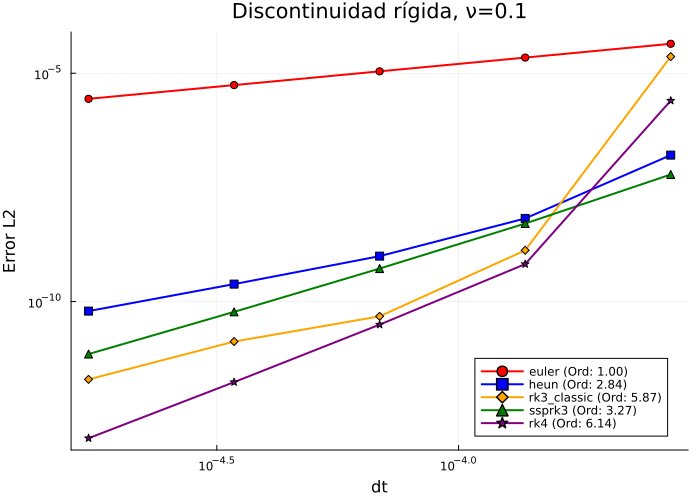


Test: Discontinuidad rígida, ν=0
Computing thin grid reference
      Reference self-consistency error: 2.63e-14


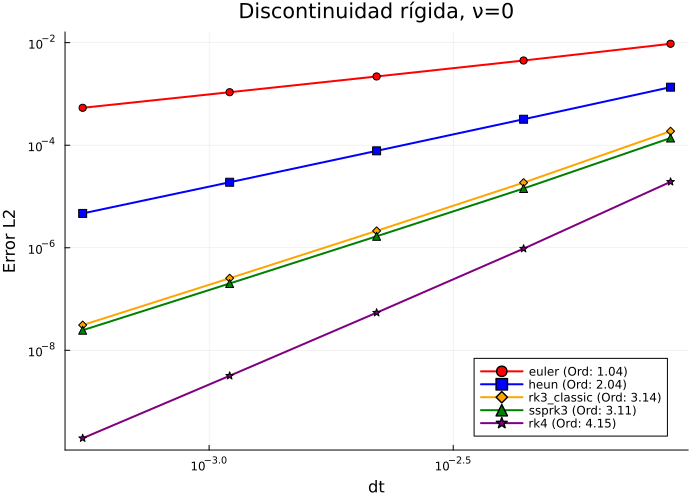


Test: Seno, ν=0.1
Computing thin grid reference
      Reference self-consistency error: 1.47e-13


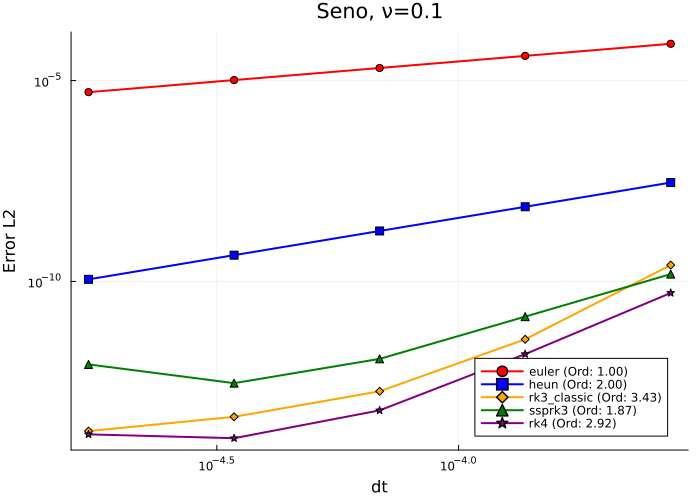


Test: Seno, ν=0
Computing thin grid reference
      Reference self-consistency error: 6.50e-14


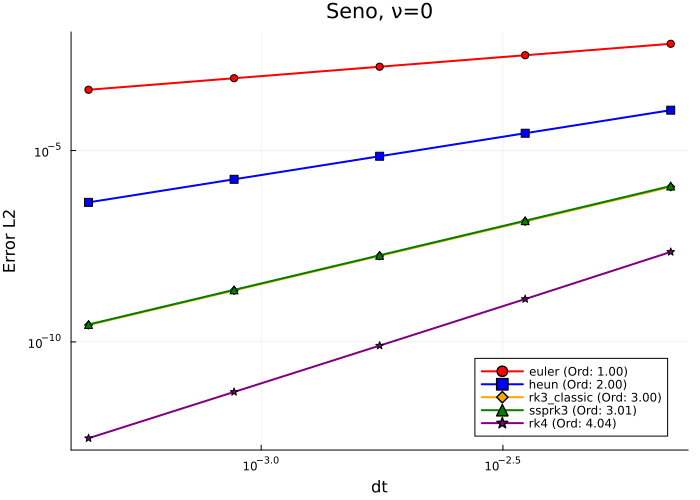


Test: Seno trasladado, ν=0.1
Computing thin grid reference
      Reference self-consistency error: 1.19e-13


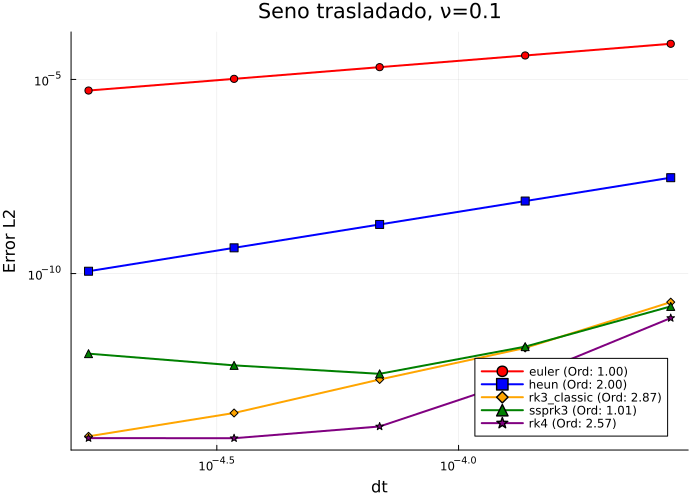


Test: Seno trasladado, ν=0
Computing thin grid reference
      Reference self-consistency error: 5.71e-14


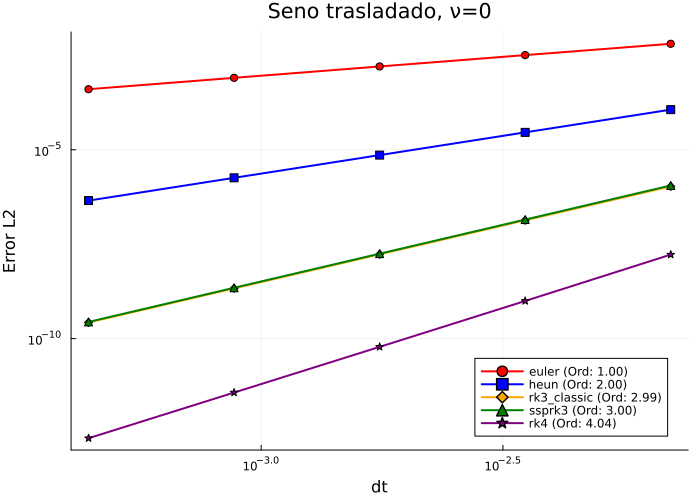


Test: Función rectangular, ν=0.1
Computing thin grid reference
      Reference self-consistency error: 6.99e-14


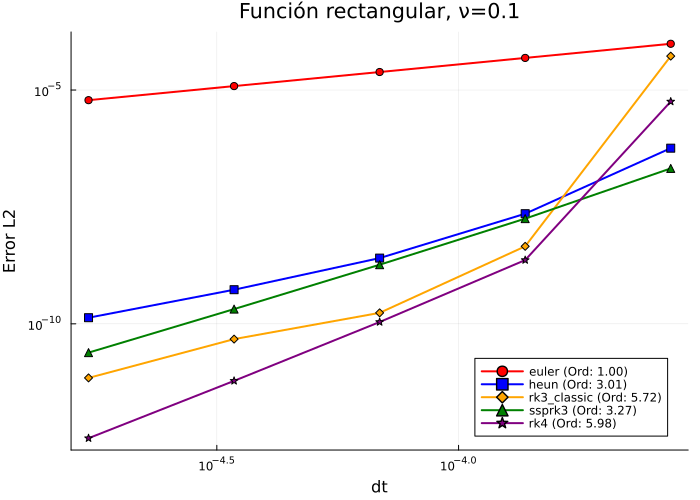


Test: Función rectangular, ν=0
Computing thin grid reference
      Reference self-consistency error: 3.16e-13


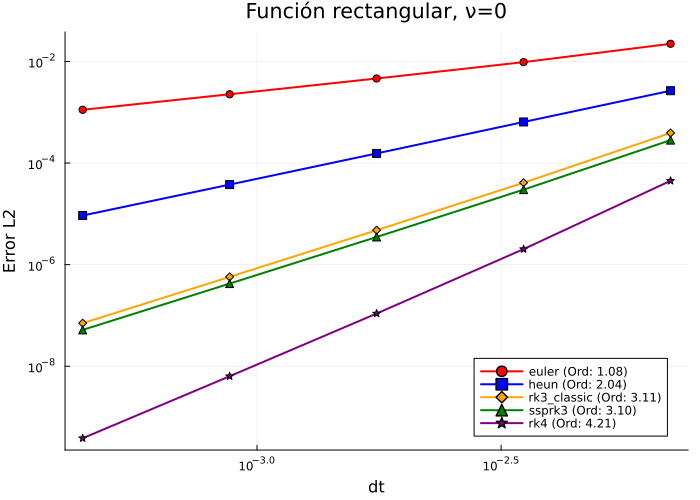

In [ ]:
function main()
    L = 2.0
    nx = 256
    x_grid = LinRange(0, L, nx)

    methods_to_test = [:euler, :heun, :rk3_classic, :ssprk3, :rk4]

    # stiff discont
    v0 = zeros(nx)
    for i in 1:nx
        if x_grid[i] >= sqrt(2) && x_grid[i] <= 1.9
            v0[i] = sqrt(2) - exp(sqrt(2)-x_grid[i])
        end
    end

    # square funct
    w0 = zeros(nx)
    for i in 1:nx
        if x_grid[i] >= 0.1 +sqrt(2)/10  && x_grid[i] <= 0.6+sqrt(2)/10
            w0[i] += 1.0
        end
    end

    scenarios = [
        (title="Discontinuidad rígida, ν=0.1", u0=v0, nu=0.1, method=:upwind),
        (title="Discontinuidad rígida, ν=0", u0=v0, nu=0.0, method=:upwind),
        (title="Seno, ν=0.1", u0=sin.(pi * x_grid), nu=0.1, method=:upwind),
        (title="Seno, ν=0", u0=sin.(pi * x_grid), nu=0.0, method=:upwind),
        (title="Seno trasladado, ν=0.1", u0=sin.(pi * (x_grid.-sqrt(2)/2)), nu=0.1, method=:upwind),
        (title="Seno trasladado, ν=0", u0=sin.(pi * (x_grid.-sqrt(2)/2)), nu=0.0, method=:upwind),
        (title="Función rectangular, ν=0.1", u0=w0, nu=0.1, method=:upwind),
        (title="Función rectangular, ν=0", u0=w0, nu=0.0, method=:upwind)
    ]

    for sc in scenarios
        println("\n" * "="^60)
        println("Test: $(sc.title)")
        println("="^60)

        dx = L / nx
        u_max_est = maximum(abs.(sc.u0))

        # Calculate Stability Limits
        dt_cfl = dx / (u_max_est + 1e-6)
        dt_diff = (sc.nu > 1e-9) ? 0.5 * dx^2 / sc.nu : Inf
        dt_max_theory = min(dt_cfl, dt_diff)

        # 1. Generate reference sol
        u_ref = generate_reference(sc.u0, 0.5, nx, sc.nu, L, sc.method, dt_max_theory)

        if u_ref === nothing
            continue
        end

        # set plot
        p = plot(title=sc.title, xlabel="dt", ylabel="Error L2",
                 xaxis=:log, yaxis=:log, legend=:bottomright, size=(700, 500))

        results = []

        # Run tests
        for method in methods_to_test
            res = get_convergence_data(sc.u0, 0.5, nx, sc.nu, L, sc.method, method, dt_max_theory, u_ref)
            push!(results, res)
        end

        # Plot
        colors = [:red, :blue, :orange, :green, :purple]
        shapes = [:circle, :square, :diamond, :utriangle, :star5]

        for (i, res) in enumerate(results)
            valid = .!isnan.(res.errors)
            if sum(valid) > 0
                plot!(p, res.dt_values[valid], res.errors[valid],
                      marker=shapes[i], label=res.label, color=colors[i], linewidth=2)
            end
        end

        display(p)
    end
end

main()

# Shock capturing test

running
---------------------------
Testing: euler
Testing: heun
Testing: ssprk3
Testing: rk3_classic
Testing: rk4


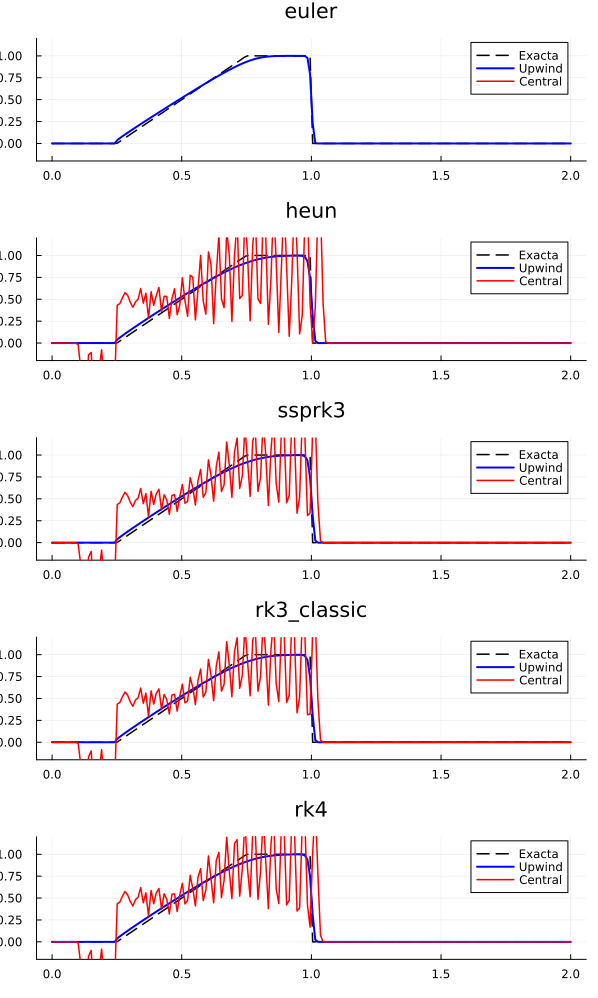

---------------------------
Saved as 'burgers_shock_comparison.png'


In [ ]:
# Exact solution for a square wave
function get_square_wave_exact(x, t)
    u_exact = similar(x)
    for i in 1:length(x)
        xi = x[i]
        # Parameters of the square wave
        head_pos = 0.25
        tail_pos = 0.25 + 1.0*t
        shock_pos = 0.75 + 0.5*t

        if xi < head_pos
            u_exact[i] = 0.0
        elseif xi >= head_pos && xi < tail_pos
            # Rarefaction Fan
            u_exact[i] = (xi - 0.25) / t
        elseif xi >= tail_pos && xi < shock_pos
            # Plateau
            u_exact[i] = 1.0
        else
            # Ahead of shock
            u_exact[i] = 0.0
        end
    end
    return u_exact
end

function run_shock_test()
    # Test Parameters
    L = 2.0
    nx = 200
    T_final = 0.5
    nu = 0.0
    CFL = 0.5

    x = LinRange(0, L, nx)

    # Initial Condition
    u0 = zeros(nx)
    for i in 1:nx
        if x[i] >= 0.25 && x[i] <= 0.75
            u0[i] = 1.0
        end
    end

    # Time step calculation
    u_max = maximum(abs.(u0))
    dt = CFL * (L/nx) / u_max

    # List of methods for test
    time_methods = [:euler, :heun, :ssprk3, :rk3_classic, :rk4]

    # for  plot
    plots_array = []

    # Compute Exact Solution once
    u_exact = get_square_wave_exact(x, T_final)

    println("running")
    println("---------------------------")

    for t_method in time_methods
        println("Testing: $t_method")

        # Upwind
        u_up = solve_burgers_time_stepping(u0, T_final, dt, nx, nu, L, :upwind, t_method)

        #  Central
        u_cen = solve_burgers_time_stepping(u0, T_final, dt, nx, nu, L, :central, t_method)

        # Plot
        p = plot(x, u_exact,
                label="Exacta",
                color=:black,
                linestyle=:dash,
                lw=1.5,
                legend=:topright,
                title="$(string(t_method))",
                ylim=(-0.2, 1.2))

        # Add Upwind
        plot!(p, x, u_up,
              label="Upwind",
              color=:blue,
              lw=2)

        # Add Central
        plot!(p, x, u_cen,
                   label="Central",
                   color=:red,
                   lw=1.5)

        push!(plots_array, p)
    end

    # Combine plots
    final_plot = plot(plots_array..., layout=(length(plots_array), 1), size=(600, 1000))

    display(final_plot)
    savefig(final_plot, "burgers_shock_comparison.png")
    println("---------------------------")
    println("Saved as 'burgers_shock_comparison.png'")
end

run_shock_test()

## Visualize after one step

Starting Simulation Loop...
---------------------------
Testing: euler
Testing: heun
Testing: ssprk3
Testing: rk3_classic
Testing: rk4


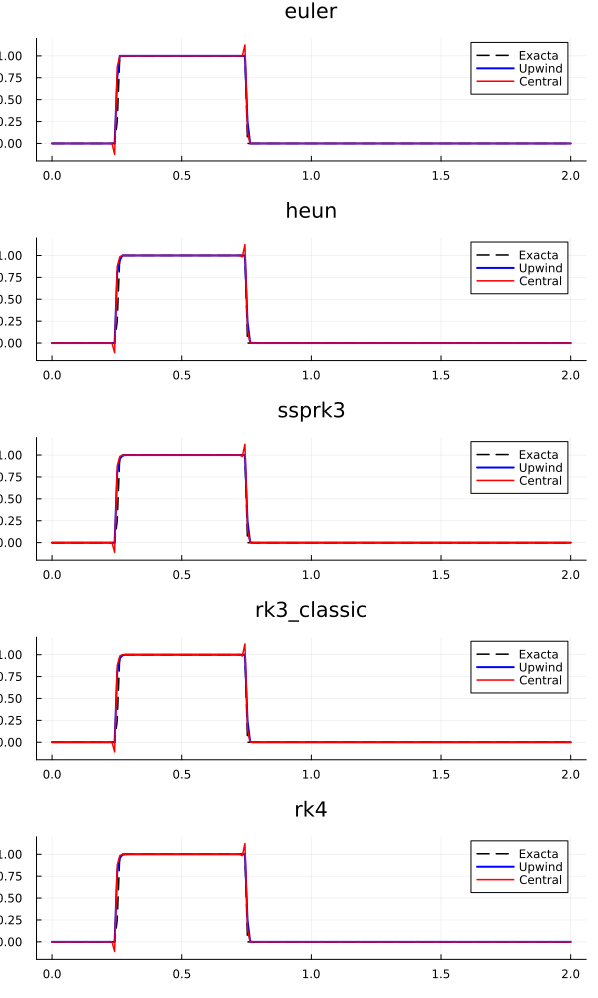

---------------------------
Saved as 'burgers_shock_comparison_one_step.png'


In [ ]:
function run_shock_test_one_step()
    # Test Parameters
    L = 2.0
    nx = 200
    nu = 0.0
    CFL = 0.5

    x = LinRange(0, L, nx)

    # Initial Condition
    u0 = zeros(nx)
    for i in 1:nx
        if x[i] >= 0.25 && x[i] <= 0.75
            u0[i] = 1.0
        end
    end

    u_max = maximum(abs.(u0))
    dt = CFL * (L/nx) / u_max
    T_final = dt

    # methods for test
    time_methods = [:euler, :heun, :ssprk3, :rk3_classic, :rk4]

    # for plot
    plots_array = []

    # Exact Solution
    u_exact = get_square_wave_exact(x, T_final)

    println("Starting Simulation Loop...")
    println("---------------------------")

    for t_method in time_methods
        println("Testing: $t_method")

        # 1. Run Upwind
        u_up = solve_burgers_time_stepping(u0, T_final, dt, nx, nu, L, :upwind, t_method)

        # 2. Run Central
        u_cen = solve_burgers_time_stepping(u0, T_final, dt, nx, nu, L, :central, t_method)

        # 3. Create Plot
        p = plot(x, u_exact,
                label="Exacta",
                color=:black,
                linestyle=:dash,
                lw=1.5,
                legend=:topright,
                title="$(string(t_method))",
                ylim=(-0.2, 1.2))

        # Add Upwind
        plot!(p, x, u_up,
              label="Upwind",
              color=:blue,
              lw=2)

        # Add Central
        plot!(p, x, u_cen,
                   label="Central",
                   color=:red,
                   lw=1.5)

        push!(plots_array, p)
    end

    # Combine plots
    final_plot = plot(plots_array..., layout=(length(plots_array), 1), size=(600, 1000))

    display(final_plot)
    savefig(final_plot, "burgers_shock_comparison_one_step.png")
    println("---------------------------")
    println("Saved as 'burgers_shock_comparison_one_step.png'")
end

run_shock_test_one_step()

# Visualize stability regions

--- Stability Report (dt = 0.06) ---
Method: Forward Euler        | Status: UNSTABLE | Max Amp: 1.5335
Method: Heun (RK2)           | Status: UNSTABLE | Max Amp: 1.4623
Method: RK3s                 | Status: STABLE | Max Amp: 1.0
Method: Classic RK4          | Status: STABLE | Max Amp: 1.0


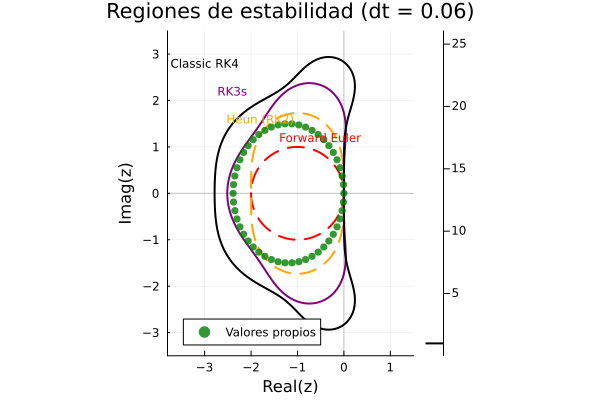

┌ Warning: Multiple series with different color share a colorbar.
│ Colorbar may not reflect all series correctly.
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:530
┌ Warning: Multiple series with different line style share a colorbar.
│ Colorbar may not reflect all series correctly.
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:530
┌ Warning: Multiple series with different line color share a colorbar.
│ Colorbar may not reflect all series correctly.
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:530
┌ Warning: Multiple series with different color share a colorbar.
│ Colorbar may not reflect all series correctly.
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:530
┌ Warning: Multiple series with different line style share a colorbar.
│ Colorbar may not reflect all series correctly.
└ @ Plots ~/.julia/packages/Plots/8ZnR3/src/backends/gr.jl:530
┌ Warning: Multiple series with different line color share a colorbar.
│ Colorbar may not refle

In [ ]:
"""
1. Computes Stability Grid for a given Polynomial Function
   Returns the grid x, y and the Magnitude matrix |G(z)|
"""
function compute_stability_grid(poly_func; xlims=(-4.0, 2.0), ylims=(-4.0, 4.0), res=300)
    x = LinRange(xlims[1], xlims[2], res)
    y = LinRange(ylims[1], ylims[2], res)
    Z = [complex(r, i) for i in y, r in x]
    G_mag = abs.(poly_func.(Z))
    return x, y, G_mag
end

"""
2. CLinearized Spatial Operator Matrix (Burgers)
"""
function get_burgers_eigenvalues(nx, L, nu, u_max)
    dx = L / nx
    diff_factor = nu / dx^2
    adv_factor  = -u_max / (2*dx)

    row_indices = Int[]
    col_indices = Int[]
    values = Float64[]

    for i in 1:nx
        im1 = (i == 1) ? nx : i - 1
        ip1 = (i == nx) ? 1 : i + 1

        # Diffusion (Central)
        push!(row_indices, i); push!(col_indices, im1); push!(values, diff_factor)
        push!(row_indices, i); push!(col_indices, i);   push!(values, -2*diff_factor)
        push!(row_indices, i); push!(col_indices, ip1); push!(values, diff_factor)

        # Advection (Central Linearized)
        push!(row_indices, i); push!(col_indices, ip1); push!(values, adv_factor)
        push!(row_indices, i); push!(col_indices, im1); push!(values, -adv_factor)
    end

    A = sparse(row_indices, col_indices, values, nx, nx)
    return eigvals(Matrix(A))
end

"""
3. Main Comparison Function
"""
function compare_rk_stability()
    # Name, Polynomial, Color, LineStyle, Label_Coordinate_Tuple
    methods = [
        ("Forward Euler", z -> 1 + z,                               :red,    :dash,  (-0.5, 1.2)),
        ("Heun (RK2)",    z -> 1 + z + 0.5*z^2,                     :orange, :dash,  (-1.8, 1.6)),
        ("RK3s",          z -> 1 + z + 0.5*z^2 + z^3/6,             :purple, :solid, (-2.4, 2.2)),
        ("Classic RK4",   z -> 1 + z + 0.5*z^2 + z^3/6 + z^4/24,    :black,  :solid, (-3.0, 2.8))
    ]


    L = 2.0
    nx = 50
    nu = 0.05 / pi
    u_max = 1.0
    dx = L/nx

    # Calculate eigenvalues
    lambdas = get_burgers_eigenvalues(nx, L, nu, u_max)

    # --- C. Choose a Test Time Step ---
    # RK3 imaginary limit is ~1.73.
    dt_target = 1.5 * dx / u_max

    # scale eigenvalues by dt
    z_vals = lambdas .* dt_target


    p = plot(title="Regiones de estabilidad (dt = $(round(dt_target, digits=3)))",
             xlabel="Real(z)", ylabel="Imag(z)",
             xlims=(-3.8, 1.5), ylims=(-3.5, 3.5),
             aspect_ratio=:equal, legend=:bottomleft)

    println("--- Stability Report (dt = $(round(dt_target, digits=4))) ---")


    for (name, poly_func, color, style, label_pos) in methods

        # 1. Plot Stability Boundary
        x_g, y_g, mag = compute_stability_grid(poly_func)
        contour!(x_g, y_g, mag, levels=[1.0], color=color, linestyle=style, linewidth=2, label=name)

        # 2. Add Text Annotation (The "Label")
        # We use the coordinates defined in the 'methods' array
        annotate!(label_pos[1], label_pos[2], text(name, 8, color, :center))

        # 3. Numerical Check
        max_amp = maximum(abs.(poly_func.(z_vals)))
        is_stable = max_amp <= 1.0 + 1e-9
        status = is_stable ? "STABLE" : "UNSTABLE"

        println("Method: $(rpad(name, 20)) | Status: $status | Max Amp: $(round(max_amp, digits=4))")
    end

    # plot eigenvals
    scatter!(real(z_vals), imag(z_vals),
             label="Valores propios", color=:green,
             markersize=4, markerstrokewidth=0, alpha=0.8)

    # Axes lines
    vline!([0], color=:black, alpha=0.2, label="")
    hline!([0], color=:black, alpha=0.2, label="")

    display(p)
end

compare_rk_stability()

Using Time Stepper: rk3_classic | dt: 0.0001 | Steps: 6000
Simulation complete.


[ Info: Saved animation to /content/burgers_rk3_classic.gif


Plots.AnimatedGif("/content/burgers_rk3_classic.gif")
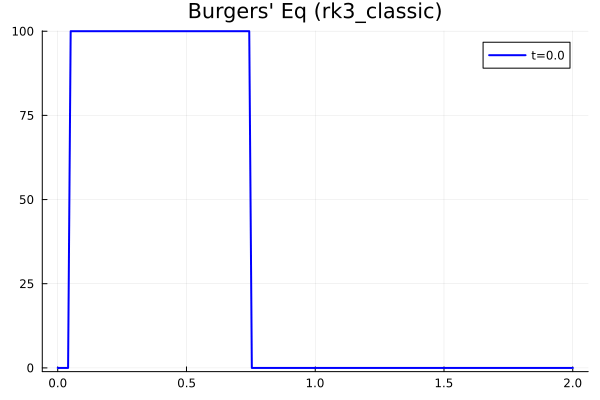

In [ ]:
function solve_burgers(u0, T, CFL, nx, nu, L, space_method, time_stepper)
    dx = L / nx

    u_max = maximum(abs.(u0))
    u_max = u_max == 0 ? 1.0 : u_max

    dt_adv = dx / u_max
    dt_diff = (nu > 1e-16) ? (0.5 * dx^2 / nu) : Inf
    dt = CFL * min(dt_adv, dt_diff)

    nt = ceil(Int, T/dt)
    #nt = 500
    dt = T / nt

    println("Using Time Stepper: $time_stepper | dt: $(round(dt, digits=5)) | Steps: $nt")

    # Pre-allocate arrays
    u = copy(u0)

    # temporary arrays
    u_tmp = similar(u)
    k1 = similar(u)
    k2 = similar(u)
    k3 = similar(u)
    k4 = similar(u)

    # History
    history = zeros(nt+1, nx)
    history[1, :] = u
    t_vals = LinRange(0, T, nt+1)

    for n in 1:nt
        if time_stepper == :euler
            # Forward Euler
            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)
            @. u = u + dt * k1

        elseif time_stepper == :heun
            # Heun's Method (RK2)
            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)
            @. u_tmp = u + dt * k1  # Predictor
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, space_method)
            @. u = u + (dt / 2) * (k1 + k2)

        elseif time_stepper == :ssprk3
            # SSP-RK3 (Shu-Osher)
            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)
            @. u_tmp = u + dt * k1

            burgers_rhs_wrapper!(k1, u_tmp, nu, dx, space_method)
            @. u_tmp = (3/4)*u + (1/4)*u_tmp + (1/4)*dt*k1

            burgers_rhs_wrapper!(k1, u_tmp, nu, dx, space_method)
            @. u = (1/3)*u + (2/3)*u_tmp + (2/3)*dt*k1

        elseif time_stepper == :rk3_classic
            # Classic RK3 (Heun's 3rd order)

            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)

            @. u_tmp = u + (dt / 3) * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, space_method)

            @. u_tmp = u + (2 * dt / 3) * k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, space_method)

            @. u = u + (dt / 4) * (k1 + 3 * k3)

        elseif time_stepper == :rk4
            # Classic RK4

            burgers_rhs_wrapper!(k1, u, nu, dx, space_method)

            @. u_tmp = u + 0.5 * dt * k1
            burgers_rhs_wrapper!(k2, u_tmp, nu, dx, space_method)

            @. u_tmp = u + 0.5 * dt * k2
            burgers_rhs_wrapper!(k3, u_tmp, nu, dx, space_method)

            @. u_tmp = u + dt * k3
            burgers_rhs_wrapper!(k4, u_tmp, nu, dx, space_method)

            @. u = u + (dt / 6) * (k1 + 2*k2 + 2*k3 + k4)
        else
            error("Time stepper :$time_stepper not in list.")
        end

        # Save history
        history[n+1, :] = u
    end

    return LinRange(0, L, nx), t_vals, history
end

function main()

    nu = 0.0
    L = 2.0
    nx = 200
    T = 0.6
    CFL = 1.0

    x_grid = LinRange(0, L, nx)
    u0 = sin.(pi * x_grid)
    u0 = zeros(nx)
    for i in 1:nx
        if x_grid[i] >= 0.05 && x_grid[i] <= 0.75
            u0[i] = 1.0
        end
    end

    # methods: : :euler, :heun, :ssprk3, :rk3_classic, :rk4
    method_choice = :rk3_classic
    #method_choice = :ssprk3

    # spatial methods: :central, :upwind
    x, t, u_history = solve_burgers(u0, T, CFL, nx, nu, L, :upwind, method_choice)

    println("Simulation complete.")

    anim = @animate for i in 1:2:length(t) # Plot every 2nd frame
        plot(x, u_history[i, :],
            title="Burgers' Eq ($method_choice)",
            ylim=(-1.1, 1.1),
            label="t=$(round(t[i], digits=2))",
            lw=2, linecolor=:blue)
    end
    gif(anim, "burgers_$(method_choice).gif", fps=15)
end

main()

#Stochastic part

In [ ]:
"""
    SolveSDE()

Run the demo for the Stochastic Burgers Equation.
"""
function SolveSDE()
    RunDemo()
end

"""
    SolveSDE(t0, T, X0, h, epsilon, q, a_func, sigma_func, scheme)

Implementation of Runge-Kutta-type mean square method for SDEs,
Extensions of FE, Heun's 2nd order scheme and RK3.
"""
function SolveSDE(t0, T, X0, h, epsilon, q, a_func, sigma_func, scheme)
    if !in(scheme, ["Heun", "RK3", "Euler"])
        error("Invalid scheme. Use 'Euler', 'Heun', or 'RK3'.")
    end

    # Initialize
    N = ceil(Int, (T - t0) / h)
    d = length(X0)

    # Preallocation of output arrays
    times = zeros(N + 1)
    trajectory = zeros(d, N + 1)

    # Set initial conditions
    times[1] = t0
    trajectory[:, 1] = X0

    t = t0
    X = copy(X0)

    # Main Time Loop
    println("Starting simulation with $N steps using $scheme scheme...")
    for k = 1:N
        if scheme == "Euler"
            X = StochasticEulerStep(X, t, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "Heun"
            X = StochasticHeunStep(X, t, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "RK3"
            X = StochasticRK3Step(X, t, h, epsilon, q, a_func, sigma_func)
        end
        t = t + h

        times[k+1] = t
        trajectory[:, k+1] = X
    end

    return times, trajectory
end

# ------------------------------------------------------------------------
# Step Functions
# ------------------------------------------------------------------------

function StochasticEulerStep(X_k, t_k, h, epsilon, q, a_func, sigma_func)
    # Inputs:
    #   X_k: Current state (d-dimensional vector)
    #   t_k: Current time
    #   h: Step size
    #   epsilon: Noise parameter
    #   q: Number of noise channels
    #   a_func: Drift function a(t, x)
    #   sigma_func: Diffusion function sigma(t, x, r) for r=1...q

    d = length(X_k)

    # Generate random variables and stochastic integrals
    I_r = zeros(q)
    for r = 1:q
        xi_r = randn()
        I_r[r] = sqrt(h) * xi_r # dW
    end

    # Drift term
    a_k = a_func(t_k, X_k)

    # Diffusion terms
    Sum_sigmaI = zeros(d)
    for r = 1:q
        sigma_rk = sigma_func(t_k, X_k, r)
        Sum_sigmaI = Sum_sigmaI + sigma_rk * I_r[r]
    end

    # Scale by epsilon
    Sum_sigmaI = epsilon * Sum_sigmaI

    # Update
    X_k1 = X_k + Sum_sigmaI + a_k * h
    return X_k1
end

function StochasticHeunStep(X_k, t_k, h, epsilon, q, a_func, sigma_func)
    # Inputs:
    #   X_k: Current state (d-dimensional vector)
    #   t_k: Current time
    #   h: Step size
    #   epsilon: Noise parameter
    #   q: Number of noise channels
    #   a_func: Drift function a(t, X)
    #   sigma_func: Diffusion function sigma(t, X, r) for r=1...q

    d = length(X_k)

    # Generate random variables and stochastic integrals
    I_r = zeros(q)
    I_r0 = zeros(q)
    I_0r = zeros(q)
    for r = 1:q
        xi_r = randn()     # N(0,1)
        eta_r = randn()    # N(0,1)

        # Integrals
        I_r[r] = sqrt(h) * xi_r
        I_r0[r] = h^(3/2) * (eta_r/sqrt(3) + xi_r) / 2
        I_0r[r] = h * I_r[r] - I_r0[r]
    end

    # Drift
    a_k = a_func(t_k, X_k)

    # Initialize diffusion sums
    Sum_sigmaI = zeros(d)
    Sum_L1sigmaI0r = zeros(d)
    Sum_LambdaAIcorr = zeros(d)

    # Diffusion terms
    for r = 1:q
        # Get diffusion vector for channel r
        sigma_rk = sigma_func(t_k, X_k, r)

        # Main diffusion term: sum(sigma_r * I_r)
        Sum_sigmaI = Sum_sigmaI + sigma_rk * I_r[r]

        # L1sigma_r = d(sigma)/dt + a * d(sigma)/dX
        L1sigma_r = ComputeL1sigma(sigma_func, t_k, X_k, a_k, r)
        Sum_L1sigmaI0r = Sum_L1sigmaI0r + L1sigma_r * I_0r[r]

        # Lambda_r a = sigma_r * d(a)/dX
        Lambda_r_a = ComputeLambdaA(a_func, sigma_rk, t_k, X_k)
        Sum_LambdaAIcorr = Sum_LambdaAIcorr + Lambda_r_a * (I_r0[r] - I_r[r] * h/2)
    end

    # Scale by epsilon
    Sum_sigmaI = epsilon * Sum_sigmaI
    Sum_L1sigmaI0r = epsilon * Sum_L1sigmaI0r
    Sum_LambdaAIcorr = epsilon * Sum_LambdaAIcorr

    # Predictor and drift at predictor:
    X_pred = X_k + Sum_sigmaI + a_k * h
    a_pred = a_func(t_k + h, X_pred)

    # Use corrector with stochastic corrections
    # Formula: X + noise + (h/2)(a_k + a_pred) + corrections
    X_k1 = X_k + Sum_sigmaI + (h/2) * (a_k + a_pred) + Sum_L1sigmaI0r + Sum_LambdaAIcorr
    return X_k1
end

function StochasticRK3Step(X_k, t_k, h, epsilon, q, a_func, sigma_func)
    # Inputs:
    #   X_k: Current state (d-dimensional vector)
    #   t_k: Current time
    #   h: Step size
    #   epsilon: Noise parameter
    #   q: Number of noise channels
    #   a_func: Drift function a(t, X)
    #   sigma_func: Diffusion function sigma(t, X, r) for r=1...q

    d = length(X_k)

    # Generate random variables and stochastic integrals
    I_r = zeros(q)
    I_r0 = zeros(q)
    I_0r = zeros(q)

    for r = 1:q
        xi_r = randn()     # N(0,1)
        eta_r = randn()    # N(0,1)

        # Integrals
        I_r[r] = sqrt(h) * xi_r
        I_r0[r] = h^(3/2) * (eta_r/sqrt(3) + xi_r) / 2
        I_0r[r] = h * I_r[r] - I_r0[r]
    end

    # Step 2: Compute drift at current point
    a_k = a_func(t_k, X_k)

    # Initialize diffusion sums
    Sum_sigmaI = zeros(d)
    Sum_L1sigmaI0r = zeros(d)
    Sum_LambdaAIcorr = zeros(d)

    # Diffusion terms and their corrections
    for r = 1:q
        # Diffusion vector for channel r
        sigma_rk = sigma_func(t_k, X_k, r)

        # Main diffusion term: sum(sigma_r * I_r)
        Sum_sigmaI = Sum_sigmaI + sigma_rk * I_r[r]

        # L1sigma_r = d(sigma)/dt + a * d(sigma)/dX
        L1sigma_r = ComputeL1sigma(sigma_func, t_k, X_k, a_k, r)
        Sum_L1sigmaI0r = Sum_L1sigmaI0r + L1sigma_r * I_0r[r]

        # Lambda_r a = sigma_r * d(a)/dX
        Lambda_r_a = ComputeLambdaA(a_func, sigma_rk, t_k, X_k)
        Sum_LambdaAIcorr = Sum_LambdaAIcorr + Lambda_r_a * I_r0[r]
    end

    # Scale by epsilon
    Sum_sigmaI = epsilon * Sum_sigmaI
    Sum_L1sigmaI0r = epsilon * Sum_L1sigmaI0r
    Sum_LambdaAIcorr = epsilon * Sum_LambdaAIcorr

    # RK3 stages
    k1 = h * a_k
    k2 = h * a_func(t_k + h/2, X_k + k1/2)
    k3 = h * a_func(t_k + h, X_k - k1 + 2*k2)

    # RK3 update
    # X_{k+1} = X_k + (k1 + 4k2 + k3)/6 + stochastic terms
    X_k1 = X_k + (k1 + 4*k2 + k3)/6 + Sum_sigmaI + Sum_L1sigmaI0r + Sum_LambdaAIcorr
    return X_k1
end

# ------------------------------------------------------------------------
# Auxiliary Functions
# ------------------------------------------------------------------------

function ComputeL1sigma(sigma_func, t, X, a, r)
    # Compute L1sigma = partial_sigma/partial_t + (a . grad) sigma
    # Uses finite difference approximation

    delta = 1e-12

    # Time derivative: (sigma(t+dt) - sigma(t)) / dt
    sig_t_plus = sigma_func(t + delta, X, r)
    sig_t_curr = sigma_func(t, X, r)
    d_dt = (sig_t_plus - sig_t_curr) / delta

    # Spatial derivative: (a . grad) sigma
    if norm(a) < 1e-14
        d_dx_a = zeros(size(X))
    else
        step = delta * a

        sig_x_plus = sigma_func(t, X + step, r)
        sig_x_minus = sigma_func(t, X - step, r)

        # Central difference
        d_dx_a = (sig_x_plus - sig_x_minus) / (2 * delta)
    end

    val = d_dt + d_dx_a
    return val
end

function ComputeLambdaA(a_func, sigma_vec, t, X)
    # Compute Lambda A = (sigma . grad) a

    delta = 1e-12

    if norm(sigma_vec) < 1e-14
        val = zeros(size(X))
    else
        step = delta * sigma_vec

        a_plus = a_func(t, X + step)
        a_minus = a_func(t, X - step)

        # Central difference
        val = (a_plus - a_minus) / (2 * delta)
    end
    return val
end


ComputeLambdaA (generic function with 1 method)

In [ ]:
plotly()

# ------------------------------------------------------------------------
# Stochastic Burgers Equation Example
# ------------------------------------------------------------------------

function burgers_drift(t, u, nu, L)
    # 1D Stochastic Burgers equation drift term
    # Conservative Form: ∂u/∂t = ν ∂²u/∂x² - 0.5 ∂(u²)/∂x
    N = length(u)
    dx = L / N

    # Vectorized Periodic Neighbors
    u_prev = circshift(u, 1)
    u_next = circshift(u, -1)

    # Diffusion Term (Central Difference)
    diffusion = nu * (u_next - 2*u + u_prev) / dx^2

    # Advection Term (Upwind Scheme)
    # -u * ∂u/∂x
    # If u > 0 (flow right): use Backward Difference (u_i - u_{i-1})
    # If u < 0 (flow left):  use Forward Difference  (u_{i+1} - u_i)

    dudx_backward = (u - u_prev) / dx
    dudx_forward  = (u_next - u) / dx

    advection = - (max.(u, 0) .* dudx_backward + min.(u, 0) .* dudx_forward)

    # Combine
    dudt = diffusion + advection
    return dudt
end

function burgers_diffusion(t, u, r)
    # 1D Stochastic Burgers equation diffusion term
    # Space-time white noise: each spatial point gets independent noise

    N = length(u)
    sigma = zeros(N)

    # q = N (one noise channel per spatial point)
    if r <= N
        sigma[r] = 1.0  # Unit diffusion at each spatial point
    end
    return sigma
end

function RunDemo()
    println("=== Running Stochastic Burgers Equation Demo ===")
    println("Equation: ∂u/∂t = ν ∂²u/∂x² - u ∂u/∂x + ε * dW/dt")
    println("Domain: x ∈ [0, 2], Periodic Boundary Conditions")
    println("Initial condition: u(x,0) = sin(πx)")

    # Spatial discretization
    L = 2.0
    Nx = 100
    dx = L / Nx
    x = collect(0:Nx-1) * dx

    # IC
    u0 = sin.(pi * x)

    # Time parameters
    t0 = 0.0
    T = 1.5
    epsilon = 0.2
    q = Nx     # One noise channel per spatial point
    nu = 0.01

    # Stability constraints
    CFL = 0.5
    u_max = maximum(abs.(u0))
    dt_adv = dx / u_max
    dt_diff = 0.5 * dx^2 / nu
    h = CFL * min(dt_adv, dt_diff)

    # Scheme (Euler, Heun, RK3)
    sch = "RK3"

    # Drift and diffusion
    drift_fun = (t, u) -> burgers_drift(t, u, nu, L)
    diff_fun = burgers_diffusion

    # Run solver
    println("Running simulation with $Nx spatial points...")
    println("Time step: $h, Noise: $epsilon")
    println("\n--- Running $sch Scheme ---")
    (t_vec, u_mat) = SolveSDE(t0, T, u0, h, epsilon, q, drift_fun, diff_fun, sch)

    # Plotting

    # Subplot 1: Initial and final solution
    p1 = plot(x, u_mat[:, 1], lc=:green, lw=2, label=nothing)
    plot!(p1, x, u_mat[:, end], lc=:red, lw=2, label=nothing)
    xlabel!(p1, "x")
    ylabel!(p1, "u(x,t)")
    title!(p1, "Soluciones Inicial y Final")

    # Subplot 2: Space-time evolution (heatmap)
    p2 = heatmap(t_vec, x, u_mat, c=:jet)
    xlabel!(p2, "t")
    ylabel!(p2, "x")
    title!(p2, "Evolución Espacio-Temporal")

    # Subplot 3: 3D surface plot
    p3 = surface(t_vec, x, u_mat, c=:jet, camera=(30, 30))
    xlabel!(p3, "t")
    ylabel!(p3, "x")
    zlabel!(p3, "u(x,t)")
    title!(p3, "Gráfico de Superficie 3D")

    # Combine subplots
    final_plot = plot(p1, p2, p3, layout=(1, 3), size=(1200, 400))
    display(final_plot)

    # Plot energy evolution in a new figure
    energy = sum(u_mat.^2, dims=1) * dx  # Approximate L2 norm
    energy = vec(energy) # Convert to 1D array for plotting

    p_energy = plot(t_vec, energy, lc=:blue, lw=2, label=nothing)
    xlabel!(p_energy, "t")
    ylabel!(p_energy, "Energía ∫ u² dx")
    title!(p_energy, "Evolución de la Energía")
    display(p_energy)

    println("Initial energy: $(energy[1])")
    println("Final energy: $(energy[end])")
end
SolveSDE()

=== Running Stochastic Burgers Equation Demo ===
Equation: ∂u/∂t = ν ∂²u/∂x² - u ∂u/∂x + ε * dW/dt
Domain: x ∈ [0, 2], Periodic Boundary Conditions
Initial condition: u(x,0) = sin(πx)
Running simulation with 100 spatial points...
Time step: 0.01, Noise: 0.2

--- Running RK3 Scheme ---
Starting simulation with 150 steps using RK3 scheme...


Initial energy: 1.0
Final energy: 0.17116810797763343


In [ ]:
# ------------------------------------------------------------------------
# Convergence Order Verification (GBM)
# ------------------------------------------------------------------------

function RunConvergenceTest1()
    @printf("Running Convergence (1 of 3) Order Verification on Geometric Brownian Motion...\n")

    # Problem Setup (GBM)
    mu = 1.0
    sigma_const = 1.0
    epsilon = 0.001
    X0 = [1.0]
    t0 = 0.0
    T = 1.0
    q = 1

    # Drift and diffusion
    drift_fun = (t, x) -> mu * x
    diff_fun = (t, x, r) -> sigma_const * x

    # Simulation Parameters
    h_steps = [2.0^(-k) for k in 1:15]
    num_mc = 1000
    schemes = ["Heun", "RK3"]

    errors = zeros(length(h_steps), length(schemes))

    p = plot(title="Análisis de Convergencia (epsilon = $epsilon)",
             xlabel="h", ylabel="RMSE Global",
             xaxis=:log, yaxis=:log, legend=:bottomright)

    colors = [:red, :green]
    markers = [:square, :utriangle]

    for s = 1:length(schemes)
        scheme = schemes[s]
        @printf("Testing scheme: %s...\n", scheme)

        for k = 1:length(h_steps)
            h = h_steps[k]
            mc_sq_errors = zeros(num_mc)

            Threads.@threads for m = 1:num_mc
                (tf, X_num, W_T) = SolveSDE_noise(t0, T, X0, h, epsilon, q, drift_fun, diff_fun, scheme)

                # Exact solution logic handles vectors now
                W_val = W_T[1]
                eff_sigma = epsilon * sigma_const
                X_exact = X0 .* exp((mu - 0.5 * eff_sigma^2) * (T - t0) + eff_sigma * W_val)

                # Compute error (sum over dimensions, though d=1 here)
                mc_sq_errors[m] = sum((X_num .- X_exact).^2)
            end

            mse_accum = sum(mc_sq_errors)
            errors[k, s] = sqrt(mse_accum / num_mc)
        end

        plot!(p, h_steps, errors[:, s], label=scheme, lw=2, m=markers[s], color=colors[s])
    end

    # Reference Slopes
    ref_h = h_steps
    slope2 = (ref_h.^2) * (errors[1,1] / ref_h[1]^2)
    slope3 = (ref_h[1:9].^3) * (errors[1,2] / ref_h[1]^3)
    slope05 = (ref_h.^0.5) * (errors[end,2] / ref_h[end]^0.5)

    plot!(p, ref_h, slope2, label="Pendiente 2", ls=:dashdot, color=:black)
    plot!(p, ref_h[1:9], slope3, label="Pendiente 3", ls=:dash, color=:black)
    plot!(p, ref_h, slope05, label="Pendiente 0.5", ls=:dot, color=:black)

    vline!(p, [epsilon^(4/3)], label="", color=:red, ls=:dash)
    vline!(p, [epsilon^(4/5)], label="", color=:green, ls=:dash)

    display(p)
    @printf("Convergence test 1 complete.\n")
end

function RunConvergenceTest2()
    @printf("Running Convergence (2 of 3) Order Verification on Geometric Brownian Motion...\n")

    # Problem Setup (GBM)
    mu = 1.0
    sigma_const = 1.0
    epsilon = 0.1
    X0 = [1.0]
    t0 = 0.0
    T = 1.0
    q = 1

    drift_fun = (t, x) -> mu * x
    diff_fun = (t, x, r) -> sigma_const * x

    h_steps = [2.0^(-k) for k in 4:16]
    num_mc = 1000
    scheme = "Euler"

    errors = zeros(length(h_steps))

    p = plot(title="Análisis de Convergencia (epsilon = $epsilon)",
             xlabel="h", ylabel="RMSE Global",
             xaxis=:log, yaxis=:log, legend=:bottomright)

    @printf("Testing scheme: %s...\n", scheme)

    for k = 1:length(h_steps)
        h = h_steps[k]
        mc_sq_errors = zeros(num_mc)

        Threads.@threads for m = 1:num_mc
            (tf, X_num, W_T) = SolveSDE_noise(t0, T, X0, h, epsilon, q, drift_fun, diff_fun, scheme)

            W_val = W_T[1]
            eff_sigma = epsilon * sigma_const
            X_exact = X0 .* exp((mu - 0.5 * eff_sigma^2) * (T - t0) + eff_sigma * W_val)

            mc_sq_errors[m] = sum((X_num .- X_exact).^2)
        end

        mse_accum = sum(mc_sq_errors)
        errors[k] = sqrt(mse_accum / num_mc)
    end

    plot!(p, h_steps, errors, label=scheme, lw=2, m=:circle, color=:blue)

    ref_h = h_steps
    slope1 = ref_h * (errors[1] / ref_h[1])
    slope05 = (ref_h.^0.5) * (errors[end] / ref_h[end]^0.5)

    plot!(p, ref_h, slope1, label="Pendiente 1", ls=:dash, color=:black)
    plot!(p, ref_h, slope05, label="Pendiente 0.5", ls=:dot, color=:black)

    vline!(p, [epsilon^4], label="", color=:blue, ls=:dash)

    display(p)
    @printf("Convergence test 2 complete.\n")
end

function RunConvergenceTest3()
    @printf("Running Convergence (3 of 3) Order Verification on Ornstein-Uhlenbeck...\n")

    # Problem Setup (Ornstein-Uhlenbeck)
    theta = 1.0
    epsilon = 0.001
    X0 = [1.0]
    t0 = 0.0
    T = 1.0
    q = 1

    drift_fun = (t, x) -> -theta * x
    diff_fun = (t, x, r) -> [1.0]

    h_steps = [2.0^(-k) for k in 1:13]
    num_mc = 1000
    schemes = ["Euler", "Heun", "RK3"]

    errors = zeros(length(h_steps), length(schemes))

    p = plot(title="Convergencia OU (epsilon = $epsilon)",
             xlabel="Tamaño de Paso (h)", ylabel="RMSE Global",
             xaxis=:log, yaxis=:log, legend=:bottomright)

    colors = [:blue, :red, :green]
    markers = [:circle, :square, :utriangle]

    for s = 1:length(schemes)
        scheme = schemes[s]
        @printf("Testing scheme: %s...\n", scheme)

        for k = 1:length(h_steps)
            h = h_steps[k]

            mc_sq_errors = zeros(num_mc)

            Threads.@threads for m = 1:num_mc
                N = round(Int, (T - t0) / h)

                (tf, X_num, dW_history) = SolveSDE_Stochastic_OU(t0, T, X0, h, epsilon, q, drift_fun, diff_fun, scheme)

                stoch_int = 0.0
                current_time = t0
                for i = 1:N
                    stoch_int += exp(theta * current_time) * dW_history[i]
                    current_time += h
                end

                X_exact = X0 .* exp(-theta * T) .+ epsilon * exp(-theta * T) * stoch_int

                mc_sq_errors[m] = sum((X_num .- X_exact).^2)
            end

            mse_accum = sum(mc_sq_errors)
            errors[k, s] = sqrt(mse_accum / num_mc)
        end

        plot!(p, h_steps, errors[:, s], label=scheme, lw=2, m=markers[s], color=colors[s])
    end

    ref_h = h_steps
    slope1 = ref_h * (errors[1,1] / ref_h[1])
    slope2 = (ref_h.^2) * (errors[1,2] / ref_h[1]^2)
    slope3 = (ref_h[1:6].^3) * (errors[1,3] / ref_h[1]^3)

    plot!(p, ref_h, slope1, label="Pendiente 1", ls=:dash, color=:black)
    plot!(p, ref_h, slope2, label="Pendiente 2", ls=:dashdot, color=:black)
    plot!(p, ref_h[1:6], slope3, label="Pendiente 3", ls=:dot, color=:black)

    vline!(p, [epsilon], label="", color=:red, ls=:dash)
    vline!(p, [sqrt(epsilon)], label="", color=:green, ls=:dash)

    display(p)
    @printf("Convergence test 3 complete.\n")
end

# ------------------------------------------------------------------------
# SOLVER IMPLEMENTATION
# ------------------------------------------------------------------------

function SolveSDE_noise(t0, T, X0, h, epsilon, q, a_func, sigma_func, scheme)
    # Returns:
    #   tf: Final time
    #   X: Final state vector
    #   W_acc: Accumulated Wiener process value W(T) (vector of length q)

    # Initialize
    N = ceil(Int, (T - t0) / h)
    tf = t0
    X = copy(X0)
    W_acc = zeros(q)

    # Main Time Loop
    for k = 1:N
        if scheme == "Euler"
            (X, dW) = StochasticEulerStep_noise(X, tf, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "Heun"
            (X, dW) = StochasticHeunStep_noise(X, tf, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "RK3"
            (X, dW) = StochasticRK3Step_noise(X, tf, h, epsilon, q, a_func, sigma_func)
        else
            error("Unknown scheme")
        end

        # Update State
        tf = tf + h
        W_acc = W_acc + dW # Accumulate the actual noise increment used
    end

    return tf, X, W_acc
end

# ------------------------------------------------------------------------
# SPECIAL SOLVER FOR OU (Returns Full Noise History)
# ------------------------------------------------------------------------

function SolveSDE_Stochastic_OU(t0, T, X0, h, epsilon, q, a_func, sigma_func, scheme)
    N = ceil(Int, (T - t0) / h)
    tf = t0
    X = copy(X0)
    dW_hist = zeros(N)

    for k = 1:N
        local dW_vec
        if scheme == "Euler"
            (X, dW_vec) = StochasticEulerStep_noise(X, tf, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "Heun"
            (X, dW_vec) = StochasticHeunStep_noise(X, tf, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "RK3"
            (X, dW_vec) = StochasticRK3Step_noise(X, tf, h, epsilon, q, a_func, sigma_func)
        end

        tf = tf + h
        dW_hist[k] = dW_vec[1] # Store dW for the first channel
    end

    return tf, X, dW_hist
end

# ------------------------------------------------------------------------
# Step Functions (Modified to return dW)
# ------------------------------------------------------------------------

function StochasticEulerStep_noise(X_k, t_k, h, epsilon, q, a_func, sigma_func)
    d = length(X_k)

    # Generate random variables
    I_r = zeros(q)
    for r = 1:q
        xi_r = randn()
        I_r[r] = sqrt(h) * xi_r # dW
    end

    # Drift term
    a_k = a_func(t_k, X_k)

    # Diffusion terms
    Sum_sigmaI = zeros(d)
    for r = 1:q
        sigma_rk = sigma_func(t_k, X_k, r)
        Sum_sigmaI = Sum_sigmaI + sigma_rk * I_r[r]
    end

    # Scale by epsilon
    Sum_sigmaI = epsilon * Sum_sigmaI

    # Update
    X_k1 = X_k + Sum_sigmaI + a_k * h

    return X_k1, I_r
end

function StochasticHeunStep_noise(X_k, t_k, h, epsilon, q, a_func, sigma_func)
    d = length(X_k)

    # Generate random variables
    I_r = zeros(q)
    I_r0 = zeros(q)
    I_0r = zeros(q)

    for r = 1:q
        xi_r = randn()
        eta_r = randn()

        I_r[r] = sqrt(h) * xi_r # dW
        I_r0[r] = h^(3/2) * (eta_r/sqrt(3) + xi_r) / 2
        I_0r[r] = h * I_r[r] - I_r0[r]
    end

    # Drift
    a_k = a_func(t_k, X_k)

    # Initialize diffusion sums
    Sum_sigmaI = zeros(d)
    Sum_L1sigmaI0r = zeros(d)
    Sum_LambdaAIcorr = zeros(d)

    # Diffusion terms
    for r = 1:q
        sigma_rk = sigma_func(t_k, X_k, r)
        Sum_sigmaI = Sum_sigmaI + sigma_rk * I_r[r]

        L1sigma_r = ComputeL1sigma(sigma_func, t_k, X_k, a_k, r)
        Sum_L1sigmaI0r = Sum_L1sigmaI0r + L1sigma_r * I_0r[r]

        Lambda_r_a = ComputeLambdaA(a_func, sigma_rk, t_k, X_k)
        Sum_LambdaAIcorr = Sum_LambdaAIcorr + Lambda_r_a * (I_r0[r] - I_r[r] * h/2)
    end

    # Scale by epsilon
    Sum_sigmaI = epsilon * Sum_sigmaI
    Sum_L1sigmaI0r = epsilon * Sum_L1sigmaI0r
    Sum_LambdaAIcorr = epsilon * Sum_LambdaAIcorr

    # Predictor
    X_pred = X_k + Sum_sigmaI + a_k * h
    a_pred = a_func(t_k + h, X_pred)

    # Corrector
    X_k1 = X_k + Sum_sigmaI + (h/2) * (a_k + a_pred) + Sum_L1sigmaI0r + Sum_LambdaAIcorr

    return X_k1, I_r
end

function StochasticRK3Step_noise(X_k, t_k, h, epsilon, q, a_func, sigma_func)
    d = length(X_k)

    I_r = zeros(q)
    I_r0 = zeros(q)
    I_0r = zeros(q)

    for r = 1:q
        xi_r = randn()
        eta_r = randn()

        I_r[r] = sqrt(h) * xi_r
        I_r0[r] = h^(3/2) * (eta_r/sqrt(3) + xi_r) / 2
        I_0r[r] = h * I_r[r] - I_r0[r]
    end

    a_k = a_func(t_k, X_k)

    Sum_sigmaI = zeros(d)
    Sum_L1sigmaI0r = zeros(d)
    Sum_LambdaAIcorr = zeros(d)

    for r = 1:q
        sigma_rk = sigma_func(t_k, X_k, r)
        Sum_sigmaI = Sum_sigmaI + sigma_rk * I_r[r]

        L1sigma_r = ComputeL1sigma(sigma_func, t_k, X_k, a_k, r)
        Sum_L1sigmaI0r = Sum_L1sigmaI0r + L1sigma_r * I_0r[r]

        Lambda_r_a = ComputeLambdaA(a_func, sigma_rk, t_k, X_k)
        Sum_LambdaAIcorr = Sum_LambdaAIcorr + Lambda_r_a * I_r0[r]
    end

    Sum_sigmaI = epsilon * Sum_sigmaI
    Sum_L1sigmaI0r = epsilon * Sum_L1sigmaI0r
    Sum_LambdaAIcorr = epsilon * Sum_LambdaAIcorr

    k1 = h * a_k
    k2 = h * a_func(t_k + h/2, X_k + k1/2)
    k3 = h * a_func(t_k + h, X_k - k1 + 2*k2)

    X_k1 = X_k + (k1 + 4*k2 + k3)/6 + Sum_sigmaI + Sum_L1sigmaI0r + Sum_LambdaAIcorr

    return X_k1, I_r
end

StochasticRK3Step_noise (generic function with 1 method)

Running Convergence (1 of 3) Order Verification on Geometric Brownian Motion...
Testing scheme: Heun...
Testing scheme: RK3...


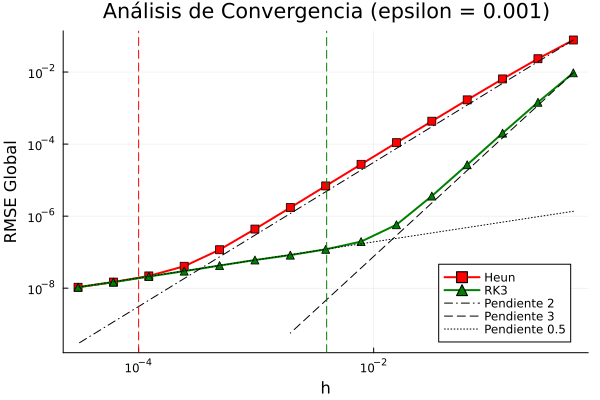

Convergence test 1 complete.
Running Convergence (2 of 3) Order Verification on Geometric Brownian Motion...
Testing scheme: Euler...


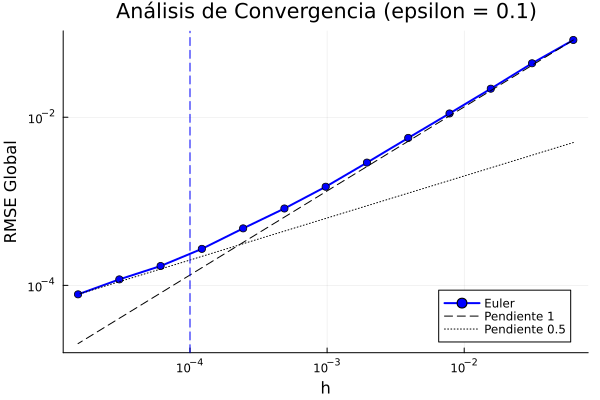

Convergence test 2 complete.
Running Convergence (3 of 3) Order Verification on Ornstein-Uhlenbeck...
Testing scheme: Euler...
Testing scheme: Heun...
Testing scheme: RK3...


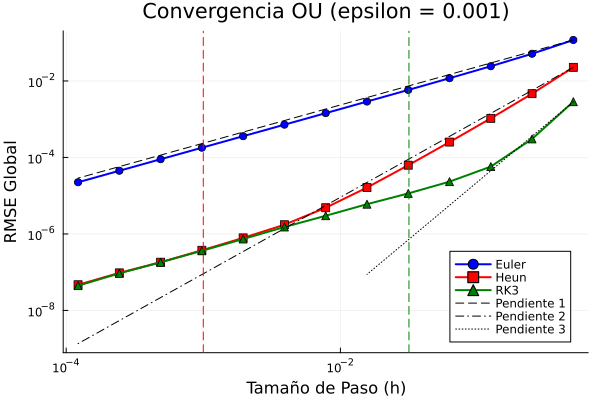

Convergence test 3 complete.


In [ ]:
RunConvergenceTest1()
RunConvergenceTest2()
RunConvergenceTest3()

In [ ]:
gr()

function SolveSDE_light(varargin...)
# Implementation of Runge-Kutta-type mean square method for SDEs,
# Extensions of FE, Heun's 2nd order scheme and RK3.
# Returns solution at final step.
#
# USAGE MODES:
# 1. No arguments -> example: RunDemo placeholder.
# 2. With arguments:
#    (tf, X) = SolveSDE_light(t0, T, X0, h, epsilon, q, drift_fun, diff_fun, scheme)

    # Unpack args
    if length(varargin) == 0
        RunDemo()
        return nothing, nothing
    elseif length(varargin) == 9
        (t0, T, X0, h, epsilon, q, a_func, sigma_func, scheme) = varargin
    else
        error("Invalid number of arguments. Expected 9 arguments.")
    end

    if !in(scheme, ["Heun", "RK3", "Euler"])
        error("Invalid scheme. Use 'Euler', 'Heun', or 'RK3'.")
    end

    # Initialize
    N = ceil(Int, (T - t0) / h)
    tf = t0
    X = copy(X0)

    for k = 1:N
        if scheme == "Euler"
            X = StochasticEulerStep(X, tf, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "Heun"
            X = StochasticHeunStep(X, tf, h, epsilon, q, a_func, sigma_func)
        elseif scheme == "RK3"
            X = StochasticRK3Step(X, tf, h, epsilon, q, a_func, sigma_func)
        end
        tf = tf + h
    end

    return tf, X
end

# ------------------------------------------------------------------------
# RunStabilityAnalysis
# ------------------------------------------------------------------------
# Mean-Square Stability Analysis for Stochastic Runge-Kutta Schemes
# Tests: Euler, Heun, and RK3
# System: Linear Test Equation dX = a*X*dt + epsilon*b*X*dW

function RunStabilityAnalysis()
    # Simulation Parameters
    T_sim   = 10.0          # End time
    h_vals  = [0.1, 0.3, 0.9] # Fixed step sizes to test
    M       = 100           # Monte Carlo paths per grid point
    X0      = [1.0]         # IC
    b       = 1.0           # Fixed diffusion coefficient base
    q       = 1             # Number of noise channels

    # Grid for Stability Region
    # Vary aand epsilon
    a_vals       = collect(range(-7, 1, length=80))   # Drift a
    epsilon_vals = collect(range(0, 5, length=50))    # Noise magnitude epsilon
    schemes = ["Euler", "Heun", "RK3"]

    # Main Analysis Loop
    # ---------------------------------------------------------
    @printf("Starting Stability Analysis...\n")
    @printf("Grid Size: %dx%d | Paths per point: %d | Time Horizon: %.2f\n",
        length(a_vals), length(epsilon_vals), M, T_sim)

    # Pre-define function handles for Linear Test Equation
    # a(t,x) = a*x
    # sigma(t,x) = b*x
    drift_handle = (t, x, a_param) -> a_param .* x
    diff_handle  = (t, x, r, b_param) -> b_param .* x

    timer_start = time()
    plots_array = []

    # Outer loop for step sizes h
    for h_idx = 1:length(h_vals)
        h = h_vals[h_idx]
        @printf("\n=== Testing Step Size h = %.1f ===\n", h)

        # Store results for this h: [epsilon_idx, a_idx, scheme_idx]
        stability_maps = zeros(length(epsilon_vals), length(a_vals), length(schemes))

        for s = 1:length(schemes)
            current_scheme = schemes[s]
            @printf("Testing Scheme: %s\n", current_scheme)

            # Loop over epsilon (rows)
            for i = 1:length(epsilon_vals)
                eps_val = epsilon_vals[i]

                # Use threads for the inner columns (a_vals)
                Threads.@threads for j = 1:length(a_vals)
                    a_val = a_vals[j]

                    # Specific handles for this iteration
                    a_fun = (t, x) -> drift_handle(t, x, a_val)
                    sigma_fun = (t, x, r) -> diff_handle(t, x, r, b)

                    # Monte Carlo Accumulator for E[|X|^2]
                    sum_sq_X = 0.0

                    # Run M paths
                    for k = 1:M
                        try
                            (_, X_final) = SolveSDE_light(0, T_sim, X0, h, eps_val, q,
                                                            a_fun, sigma_fun, current_scheme)

                            # Get scalar value from vector result
                            val_X = X_final[1]

                            # Check for NaNs or Inf (unstable)
                            if isnan(val_X) || isinf(val_X)
                                sum_sq_X = Inf
                                break
                            end

                            sum_sq_X = sum_sq_X + val_X^2
                        catch
                            # If errors (singularities) -> unstable
                            sum_sq_X = Inf
                            break
                        end
                    end

                    # Compute Mean Square
                    MS_val = sum_sq_X / M

                    # Stability Criterion:
                    if MS_val <= X0[1]^2
                        stability_maps[i, j, s] = 1 # Stable
                    else
                        stability_maps[i, j, s] = 0 # Unstable
                    end
                end
            end
        end

        # Visualization per h
        # ---------------------------------------------------------
        # Theoretical Stability Boundary for Exact Solution
        exact_a = range(minimum(a_vals), 0, length=100)
        exact_eps = sqrt.(-2 .* exact_a) ./ b

        for s = 1:3
            p = heatmap(a_vals, epsilon_vals, stability_maps[:, :, s],
                        c = cgrad([:blue, :yellow]),
                        xlabel = (h_idx == 3 ? "Deriva λ" : ""), # Only label x-axis on bottom row
                        ylabel = (s == 1 ? "Ruido ε" : ""),      # Only label y-axis on left column
                        title = "$(schemes[s]) (h=$h)",
                        xlims = (minimum(a_vals), maximum(a_vals)),
                        ylims = (minimum(epsilon_vals), maximum(epsilon_vals)),
                        legend = false,
                        ticks = :native)

            # Overlay Theoretical Exact Stability Boundary
            plot!(p, exact_a, exact_eps, lc=:red, ls=:dash, lw=2, label="Exacta")

            push!(plots_array, p)
        end
    end

    elapsed = time() - timer_start
    @printf("Analysis finished in %.2f seconds.\n", elapsed)

    # Layout 3x3 grid
    final_plot = plot(plots_array..., layout=(3, 3), size=(1200, 1000),
                      plot_title="Regiones de Estabilidad en Media Cuadrática (Variando h)")

    display(final_plot)
end

RunStabilityAnalysis (generic function with 1 method)

Starting Stability Analysis...
Grid Size: 80x50 | Paths per point: 100 | Time Horizon: 10.00

=== Testing Step Size h = 0.1 ===
Testing Scheme: Euler
Testing Scheme: Heun
Testing Scheme: RK3

=== Testing Step Size h = 0.3 ===
Testing Scheme: Euler
Testing Scheme: Heun
Testing Scheme: RK3

=== Testing Step Size h = 0.9 ===
Testing Scheme: Euler
Testing Scheme: Heun
Testing Scheme: RK3
Analysis finished in 464.86 seconds.


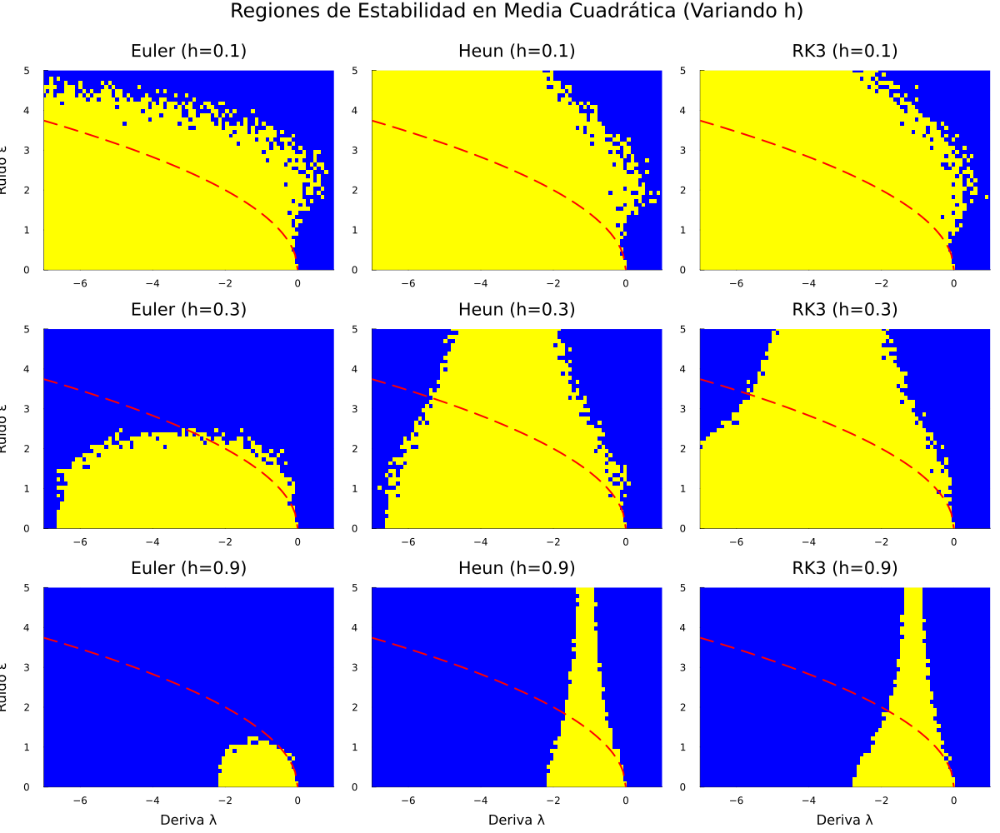

In [ ]:
RunStabilityAnalysis()